In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.regularizers import l2 ,l1
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint 
from tensorflow.keras.applications import VGG16, ResNet50, MobileNetV2

from sklearn.model_selection import train_test_split

import numpy as np
import os
import shutil
import random
import pandas as pd
import matplotlib.pyplot as plt
# plt.style.use('seaborn')
import seaborn as sns
sns.set_style('darkgrid')



In [2]:
# # check if using GPU or cpu
# !tensorflow_version 2.x

# import tensorflow as tf
# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#     raise SystemError('GPU device not found')
# print('Found GPU at: {}'.format(device_name))

In [3]:
encode_labels = {
            'Ascariasis' : 0,
            'Babesia' : 1,
            'Capillaria p' : 2,
            'Enterobius v' : 3,
            'Epidermophyton floccosum' : 4,
            'Fasciolopsis buski' : 5,
            'Hookworm egg' : 6,
            'Hymenolepis diminuta' : 7,
            'Hymenolepis nana' : 8,
            'Leishmania' : 9,
            'Opisthorchis viverrine' : 10,
            'Paragonimus spp' : 11,
            'T. rubrum' : 12,
            'Taenia spp' : 13,
            'Trichuris trichiura' : 14,
        }

decoded_labels = {value : key for key, value in encode_labels.items()}

In [4]:
#to change number of epochs so models run faster
RUN_FAST = False

num_classes = 15
BATCH_SIZE = 8

epochs = 3 if RUN_FAST else 50

IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_CHANNELS = 3

IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT, )
target_size = (IMAGE_SIZE + (IMAGE_CHANNELS, ))

#validation size
train_val_size = 0.2

#random state
rnd = 42

#change to dir path data is in
currdir = '.\\ieee-mansb-victoris-2-final\\'


train_batch1_dir = os.path.join(currdir, 'train_Images_Source_1')
train_batch2_dir = os.path.join(currdir, 'train_Images_Source_2')
test_dir  = os.path.join(currdir, 'test_data')

<br>
<br>

**- Reading `'train_Images_Source_1'`**


In [5]:
#image file names
train_batch1_dirname = os.listdir(train_batch1_dir)
print("classes directory names:", train_batch1_dirname, sep = '\n', end = '\n\n')

train_batch1 = pd.DataFrame({'image_path' : [],
                      'image_label_name' : [],
                       'image_label' : [],})

n_of_train_b1_images = 0
display = True

for dirname in train_batch1_dirname:
    # directory path
    my_currdir = os.path.join(train_batch1_dir, dirname)
    
    #encoding the label
    label = encode_labels[dirname]
    
    #images filenames inside this dir
    image_filenames = os.listdir(my_currdir)
    
    #number of train images
    n_of_train_b1_images += len(image_filenames)
    
    #getting image full-path by joining dir path and image filename
    image_fullpath = pd.Series([os.path.join(my_currdir, x) for x in image_filenames])
    
    #making a dataframe with 3 columns
    class_df = pd.DataFrame({'image_path' : image_fullpath,}) #image full path
    class_df['image_label_name'] = dirname  #label name
    class_df['image_label'] = label  #label encoded

    #concat the class dataframe in with the train dataframe
    train_batch1 = pd.concat([train_batch1, class_df], axis = 0)
    
    if display:
        print('Current directory:', my_currdir, '\n')
        print('Label name:', dirname, '\nLabel Encoded:', label, '\n')
        print("image filename:", image_filenames[ : 2], sep = '\n', end = '\n\n')
        print("image full path:", image_fullpath[ : 2].values, sep = '\n', end = '\n\n')
        print('______________________________________________________________\n\n\n')
        display = False


#making sure all images read successfully
assert train_batch1.isna().sum().sum() == 0
assert train_batch1.shape[0] == n_of_train_b1_images

#looking at sample from the train dataframe
train_batch1.sample(10)

classes directory names:
['Ascariasis', 'Babesia', 'Capillaria p', 'Enterobius v', 'Epidermophyton floccosum', 'Fasciolopsis buski', 'Hookworm egg', 'Hymenolepis diminuta', 'Hymenolepis nana', 'Leishmania', 'Opisthorchis viverrine', 'Paragonimus spp', 'T. rubrum', 'Taenia spp', 'Trichuris trichiura']

Current directory: .\ieee-mansb-victoris-2-final\train_Images_Source_1\Ascariasis 

Label name: Ascariasis 
Label Encoded: 0 

image filename:
['Ascaris lumbricoides_0001.jpg', 'Ascaris lumbricoides_0001_n_p.jpg']

image full path:
['.\\ieee-mansb-victoris-2-final\\train_Images_Source_1\\Ascariasis\\Ascaris lumbricoides_0001.jpg'
 '.\\ieee-mansb-victoris-2-final\\train_Images_Source_1\\Ascariasis\\Ascaris lumbricoides_0001_n_p.jpg']

______________________________________________________________





,image_path,image_label_name,image_label
109,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Hymenolepis diminuta,7.0
71,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
140,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Hymenolepis nana,8.0
235,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Enterobius v,3.0
367,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Taenia spp,13.0
370,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Enterobius v,3.0
173,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Paragonimus spp,11.0
325,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Taenia spp,13.0
130,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Epidermophyton floccosum,4.0
268,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0


<br>
<br>

**- Reading `'train_Images_Source_2'`**


In [6]:
#image file names
train_batch2_paths = os.listdir(train_batch2_dir)
print("image filename:", train_batch2_paths[ : 2], sep = '\n', end = '\n\n')

#number of train images
n_of_train_b2_images = len(train_batch2_paths)

# full image paths
filepaths = pd.Series([os.path.join(train_batch2_dir, x) for x in train_batch2_paths])
print("image full path:", filepaths[:2].values, sep = '\n', end = '\n\n')

#label name of image
label_names = pd.Series([x.split('_')[0] for x in train_batch2_paths])
print("image label name:", label_names[:2].values, sep = '\n', end = '\n\n')

#encoding label name of image
labels = label_names.map(encode_labels)
print("image label encoded:", labels[:2].values, sep = "\n", end = '\n\n')


#making dataframe of the three columns
train_batch2 = pd.DataFrame({'image_path' : filepaths,  
                             'image_label_name' : label_names,
                             'image_label' : labels,})

df = pd.concat([train_batch1, train_batch2], axis = 0)

#making sure all images read successfully
n_of_train_images = n_of_train_b1_images + n_of_train_b2_images
assert df.isna().sum().sum() == 0
assert df.shape[0] == n_of_train_images


print(df.shape)
df.sample(10)

image filename:
['Ascariasis_0.jpg', 'Ascariasis_1.jpg']

image full path:
['.\\ieee-mansb-victoris-2-final\\train_Images_Source_2\\Ascariasis_0.jpg'
 '.\\ieee-mansb-victoris-2-final\\train_Images_Source_2\\Ascariasis_1.jpg']

image label name:
['Ascariasis' 'Ascariasis']

image label encoded:
[0 0]

(11910, 3)


,image_path,image_label_name,image_label
2327,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Hookworm egg,6.0
123,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Trichuris trichiura,14.0
233,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Paragonimus spp,11.0
317,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Ascariasis,0.0
426,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Babesia,1.0
1661,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Epidermophyton floccosum,4.0
1112,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Enterobius v,3.0
623,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Leishmania,9.0
218,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Fasciolopsis buski,5.0
709,.\ieee-mansb-victoris-2-final\train_Images_Sou...,Leishmania,9.0


In [7]:
train_batch2.loc[0, 'image_path']

'.\\ieee-mansb-victoris-2-final\\train_Images_Source_2\\Ascariasis_0.jpg'

In [8]:
train_batch2.columns

Index(['image_path', 'image_label_name', 'image_label'], dtype='object')

In [9]:
path_ = os.path.join(currdir, 'train_Images_Source_2_grouped')

if not os.path.isdir(path_):
    os.mkdir(path_)
    classes = train_batch2['image_label_name'].unique()
    grouped = train_batch2.groupby('image_label_name') 
    for target_class in classes:
        class_path = os.path.join(path_, target_class)
        print("copying:",target_class)
        os.mkdir(class_path)
        my_class = grouped.get_group(target_class)['image_path']
        n = 0
        for image_path in my_class:
            image_name = f'{target_class}_{n}.jpg'
            n += 1
            src = image_path
            dst = os.path.join(class_path, image_name)
            #print(dst, '\n', src)
            shutil.copyfile(src, dst)
            if n%10 == 0:
                print('-', end = '')
        print()            

<br>
<br>

**- Reading test images**

In [10]:
# reading all filenames in test directory
filenames = os.listdir(test_dir)
print("test images filenames:", filenames[:4], sep = "\n")

# extracting the id from filename
ids = [int(x.split('.')[0]) for x in filenames]
print("ids :", ids[:4], sep = "\n")

# creating the dataframe with ids, filenames
test = pd.DataFrame({'id' : ids, 'filename' : filenames})
print('test-set shape:', test.shape, sep = "\n")

# sorting the test dataframe by the id and reseting index
test.sort_values(by = ['id'], axis = 0, inplace = True)
test.reset_index(inplace = True, drop = True)

# droping the id column as it's no longer useful
test.drop(columns = ['id'], inplace = True)

test.head()

test images filenames:
['0.jpg', '1.jpg', '10.jpg', '100.jpg']
ids :
[0, 1, 10, 100]
test-set shape:
(5108, 2)


,filename
0,0.jpg
1,1.jpg
2,2.jpg
3,3.jpg
4,4.jpg


**- spliting train to train and validation**

In [11]:
train, val = train_test_split(df, test_size= 0.3,
                              stratify= df['image_label_name'],
                              random_state= rnd)

In [12]:
train_datagen = ImageDataGenerator( rescale = 1.0/255, )

train_datagen = train_datagen.flow_from_dataframe(
                                              # dataframe to get paths from
                                                dataframe = train,
                                              # None because images have absolute paths
                                                directory = None,
                                              # column name file paths are in
                                                x_col = 'image_path',
                                              # column name output targets are in
                                                y_col = 'image_label_name',
                                              # size to rescale the output images to
                                                target_size = IMAGE_SIZE,
                                              # size of the batch
                                                batch_size = BATCH_SIZE,
                                              # mode "raw" output targets is array of y_col as it is
                                                class_mode = 'categorical',
                                                shuffle= False,
                                            )

Found 8337 validated image filenames belonging to 15 classes.


In [13]:
val_datagen = ImageDataGenerator( rescale = 1.0/255, )

val_datagen = val_datagen.flow_from_dataframe(
                                              # dataframe to get paths from
                                                dataframe = val,
                                              # None because images have absolute paths
                                                directory = None,
                                              # column name file paths are in
                                                x_col = 'image_path',
                                              # column name output targets are in
                                                y_col = 'image_label_name',
                                              # size to rescale the output images to
                                                target_size = IMAGE_SIZE,
                                              # size of the batch
                                                batch_size = BATCH_SIZE,
                                              # mode "raw" output targets is array of y_col as it is
                                                class_mode = 'categorical',
                                            )

Found 3573 validated image filenames belonging to 15 classes.


In [14]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = test_datagen.flow_from_dataframe(
                                test, 
                                test_dir, 
                                x_col='filename',
                                y_col=None,
                                class_mode=None,
                                target_size= IMAGE_SIZE,
                                batch_size= BATCH_SIZE,
                                shuffle=False
                            )

Found 5108 validated image filenames.


**- train sample images**

In [39]:
plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

In [16]:
def plot_batch_images(datagen,name = 'img' ,is_test = False):
    fig, ax = plt.subplots(3, 4, figsize = (16, 12))
    i, j = 0, 0
    for batch in datagen:
        #if it's test there is no labels_batch
        if is_test:
            images_batch = batch
        else:
            images_batch, labels_batch = batch
            
        #plotting first image in each batch
        ax[i][j].imshow(images_batch[0])
        if is_test:
            ax[i][j].set_title('Label: None')
        else:
            label = np.argmax(labels_batch[0])
            ax[i][j].set_title('Label:' + decoded_labels[label])
        ax[i][j].axis('off')
        #break when plotted 40 images
        i += 1
        if i == 3: i, j = 0, j+1
        if j == 4: break
    fig.tight_layout(pad=1.0)
#     plt.suptitle(name, fontsize = 40)
    plt.savefig(name + '.png', format='png', dpi=500)
    plt.show()

In [66]:
train = train.reset_index(drop = True)
filt = train['image_label_name'] == 'T. rubrum'
train.loc[filt]

,image_path,image_label_name,image_label
35,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
45,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
77,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
83,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
116,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
...,...,...,...
8201,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
8210,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
8230,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0
8248,.\ieee-mansb-victoris-2-final\train_Images_Sou...,T. rubrum,12.0


In [60]:
train['image_label_name'].unique()

array(['Babesia', 'Trichuris trichiura', 'Leishmania',
       'Fasciolopsis buski', 'Capillaria p', 'Enterobius v', 'Ascariasis',
       'Opisthorchis viverrine', 'Paragonimus spp', 'Hymenolepis nana',
       'Epidermophyton floccosum', 'Taenia spp', 'Hymenolepis diminuta',
       'T. rubrum', 'Hookworm egg'], dtype=object)

In [69]:
train_datagen = ImageDataGenerator( rescale = 1.0/255, 
                                    rotation_range=45,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    vertical_flip = True,
                                    fill_mode='nearest',
                                   )

train_datagen = train_datagen.flow_from_dataframe(
                                              # dataframe to get paths from
                                                dataframe = train.loc[83:83],
                                              # None because images have absolute paths
                                                directory = None,
                                              # column name file paths are in
                                                x_col = 'image_path',
                                              # column name output targets are in
                                                y_col = 'image_label_name',
                                              # size to rescale the output images to
                                                target_size = IMAGE_SIZE,
                                              # size of the batch
                                                batch_size = 1,
                                              # mode "raw" output targets is array of y_col as it is
                                                class_mode = 'categorical',
                                                shuffle= False,
                                            )

Found 1 validated image filenames belonging to 1 classes.


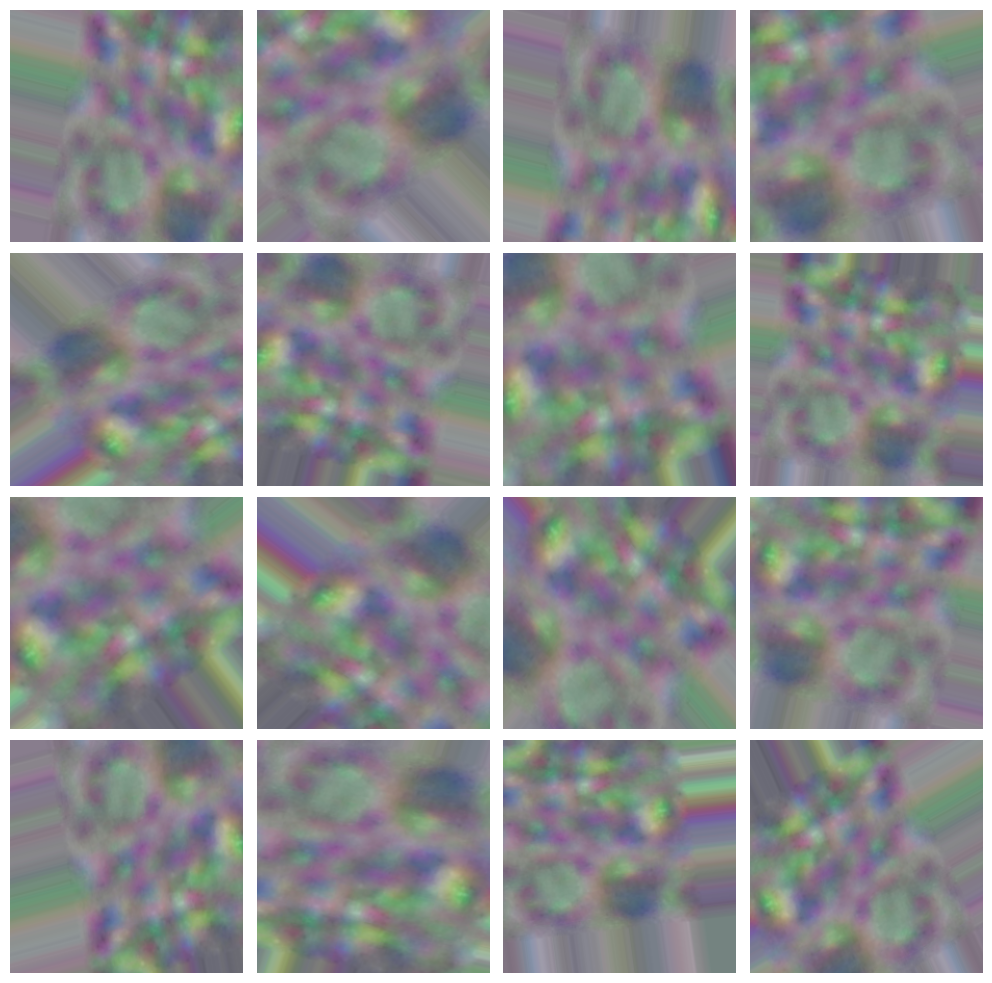

In [70]:
fig, ax = plt.subplots(4, 4, figsize = (10, 10))
i, j = 0, 0
for images_batch, labels_batch in train_datagen:
    #plotting first image in each batch
    ax[i][j].imshow(images_batch[0])
    label = np.argmax(labels_batch[0])
    ax[i][j].axis('off')
    #break when plotted 40 images
    fig.tight_layout(pad=1.0)
    i += 1
    if i == 4: i, j = 0, j+1
    if j == 4: break
        
plt.savefig('image_augmentation2.png', format = 'png', dpi = 500)
plt.show()

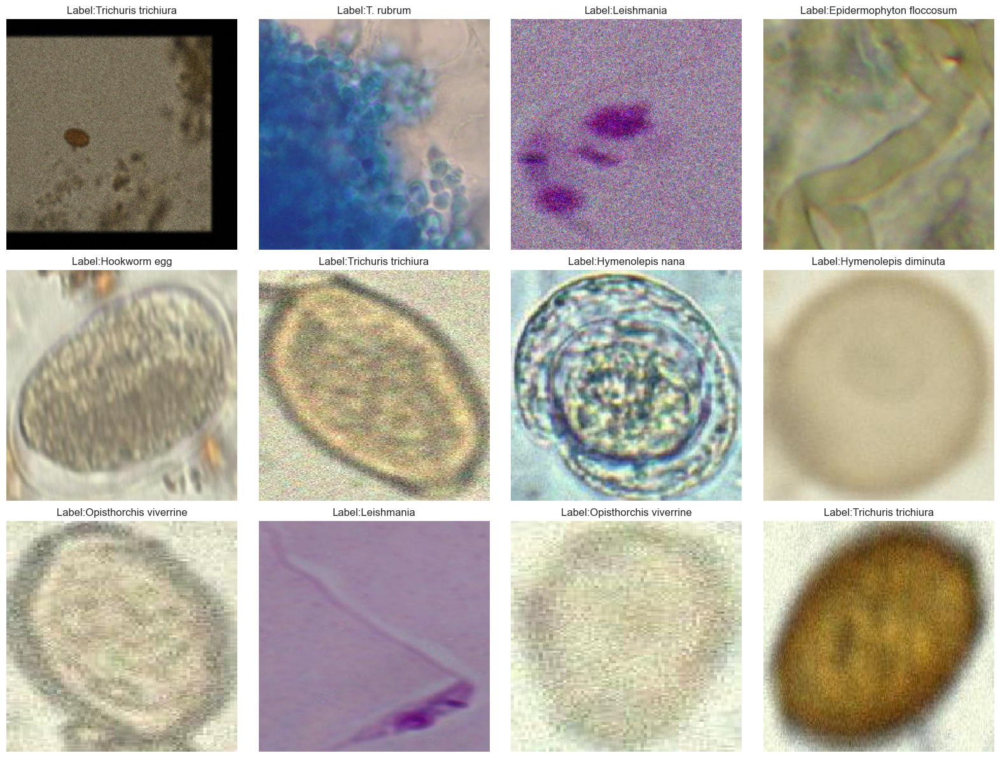

In [18]:
plot_batch_images(train_datagen)

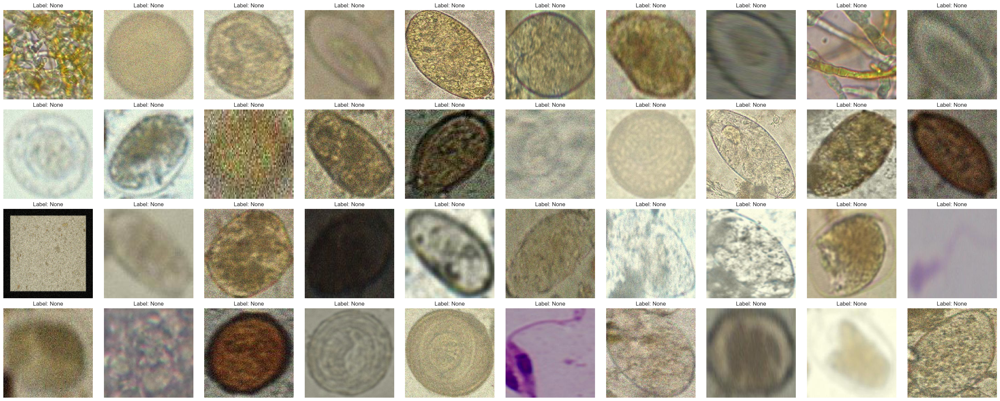

In [45]:
plot_batch_images(test_datagen, 'Test Data Sample',is_test = True)

In [19]:
my_table = (100*df['image_label_name'].value_counts(normalize= True).sort_index()).round(3)
my_table.values.reshape(-1, 1)

In [20]:
fig, ax = plt.subplots(figsize = (14, 8), dpi = 300)
sns.countplot(y = 'image_label_name', data= df, color = '#94acc2')
plt.suptitle('Count of Each Class', fontsize = 20)
plt.savefig('Classes Counts.png', format='png', dpi=500)
plt.show()

<br>
<br>
<br>

__________________________________

<br>
<br>
<br>

In [21]:
data_dir = 'data'
data = []
for image_class in os.listdir(data_dir): 
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        img = plt.imread(image_path)
        data.append(img)

In [ ]:
def plot_images_random(images, labels, class_names, n_rows, n_cols):
    indices = random.sample(range(len(images)), n_rows * n_cols)
    plt.figure(figsize=(n_cols * 1.2, n_rows * 1.2))
    for i, index in enumerate(indices):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(images[index], cmap="binary", interpolation="nearest")
        plt.axis('off')
        plt.title(class_names[labels[index][0]])
    plt.subplots_adjust(wspace=0.2, hspace=0.5)
    plt.show()

# Example usage
n_rows = 4
n_cols = 10
class_names = [''] 

plot_images_random(x_train, y_train, class_names, n_rows, n_cols)

In [ ]:
train_datagen_augmented = ImageDataGenerator(
                                    rescale=1./255,
                                    rotation_range=20,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest'
                                )

train_generator_augmented = train_datagen_augmented.flow_from_directory(
                                    train_dir,
                                    target_size=(224, 224),
                                    batch_size=32,
                                    class_mode='binary'
                                )

In [ ]:
model = Sequential()
    # Layer 1: Convolutional layer with 64 filters
model.add(Conv2D(64, (3, 3), padding='same',input_shape=target_size))
model.add(Activation('relu'))
model.add(BatchNormalization())

    # Layer 2: Convolutional layer with 64 filters
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

    # Layer 3: Convolutional layer with 128 filters
model.add(Conv2D(128, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())

    # Layer 4: Convolutional layer with 128 filters
model.add(Conv2D(128, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
  # Layer 5: Fully connected layer with 512 units and L2 regularizatio
model.add(Dense(512,kernel_regularizer=l2(0.01)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
    # Output layer: Fully connected layer with num_classes units for classification
model.add(Dense(num_classes))
model.add(Activation('softmax'))



#tf.keras.utils.plot_model(model,to_file='model.png', show_shapes=True)

In [ ]:
model.compile(loss='categorical_crossentropy',
              optimizer='sgd',
              metrics= ['categorical_accuracy'])

In [ ]:
history = model.fit(train_datagen,
                    steps_per_epoch=(train.shape[0]//BATCH_SIZE),
                    epochs=20,
                    validation_data= val_datagen,
                    validation_steps = val.shape[0]//BATCH_SIZE,
                    shuffle=True,)

In [ ]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

model =  Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 5. Model visualization
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True)

# 6. Compile and train the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(train_generator_augmented, epochs=10, validation_data=test_generator)

In [ ]:
# compile (Hidden Output)
model.compile(loss='categorical_crossentropy',
              optimizer='sgd',
              metrics= ['categorical_accuracy'])

In [ ]:
model.summary()

In [ ]:
# Creating callbacks for the model.
# If the model dosen't continue to improve (loss), the trainning will stop.

# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor = 'val_loss', min_delta = 1e-5, patience = 6, verbose = 1)
model_rlr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.2, patience = 6, verbose = 1)

# Automatically saves the best weights of the model, based on best val_accuracy
model_mcp = ModelCheckpoint(filepath = '00.h5', monitor = 'val_categorical_accuracy',
                      save_best_only = True, verbose = 1)



In [ ]:
# Fiting the model.
history = model.fit(x_train, y_train,batch_size=batch_size,epochs=epochs,validation_data=(x_test, y_test),shuffle=True,
                     callbacks=[model_es, model_rlr, model_mcp])

In [ ]:
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    fig, ax = plt.subplots(2, 1, figsize = (8, 6))

    epochs = range(1, len(acc) + 1)
    ax[0].plot(epochs, acc, 'b--', label='Training acc')
    ax[0].plot(epochs, val_acc, 'r', label='Validation acc')
    ax[0].set_title('Training and validation accuracy')
    ax[0].legend()

    ax[1].plot(epochs, loss, 'b--', label='Training loss')
    ax[1].plot(epochs, val_loss, 'r', label='Validation loss')
    ax[1].set_title('Training and validation loss')
    ax[1].legend()
    
    plt.show()

plot_history(history)

In [18]:
cols = ['class_0',	'class_1',	'class_2',	'class_3',	'class_4',
           'class_5',	'class_6', 'class_7',	'class_8',	'class_9',
           'class_10',	'class_11',	'class_12',	'class_13',	'class_14']

val_hat = np.argmax(pd.read_csv('val_pred.csv')[cols].values, axis  = 1)
val_hat.shape

(3582,)

In [19]:
val_true = val['image_label'].values
val_true.shape

(3573,)

In [17]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

confusion_matrix(val_true, val_hat)

ValueError: Found input variables with inconsistent numbers of samples: [3573, 3582]